## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook. 

In [3]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
import xgboost as xgb

sns.set()

In [3]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [4]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

In [5]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

---

## Cargar y preparar los datos.

In [4]:
df = pd.read_csv("../../Datasets/Datos_durante_pandemia/data_durante_vol_in_ic.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos,VIX,EMV-ID,EPU,PI,MHI,FNI,SI
0,2020-01-01,1.289946,12.548403,1.89,186.06,0.00,0.00,0.00,0.00
1,2020-01-02,0.735046,12.470000,2.84,139.13,0.00,0.00,0.00,0.00
2,2020-01-03,0.591834,14.020000,1.33,108.10,0.00,0.00,0.00,0.00
3,2020-01-04,1.367154,14.646666,0.00,212.82,0.00,0.00,0.00,0.00
4,2020-01-05,1.505321,14.311970,0.86,173.76,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...
913,2022-07-02,0.778572,25.922916,11.11,130.95,4.66,25.71,0.19,-3.56
914,2022-07-03,0.819483,26.641413,23.06,135.95,0.42,7.76,0.00,-3.67
915,2022-07-04,0.843804,27.530000,15.98,309.83,0.54,31.37,0.27,-5.85
916,2022-07-05,0.850985,27.540000,18.90,116.59,0.48,38.21,0.12,-4.97


---

## Desarrollo del modelo

In [7]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [8]:
df_stats=df

In [9]:
#
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

#apply scale
#df_label=sc.fit_transform(df_label)
#df_data_normalize=sc2.fit_transform(df_data)


In [10]:
def Model(df_data,df_label,lag,estimators):
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    df_label=df_label[lag:]
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    
   
    #make model
    model=xgb.XGBRegressor(n_estimators=estimators
                        ,early_stopping_rounds=80)
    #fit the model with the train data
    
    history=model.fit(df_train,df_train_y_normalize,
          eval_set=[(df_train,df_train_y_normalize),(df_test,df_test_y_normalize)])
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)
    
    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)
    return [{"Fecha":df_stats.Fecha[lag:][:seventy_percent],"typeXGBoost":["train"]*len(trainPredict.flatten()),"XGBoost" :trainPredict.flatten()}
            ,{"Fecha":df_stats.Fecha[lag:][seventy_percent:],"typeXGBoost":["test"]*len(testPredict.flatten()),"XGBoost":testPredict.flatten()}]
   
    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados

[0]	validation_0-rmse:0.98212	validation_1-rmse:0.96377
[1]	validation_0-rmse:0.85976	validation_1-rmse:0.93937
[2]	validation_0-rmse:0.74855	validation_1-rmse:0.94939
[3]	validation_0-rmse:0.67622	validation_1-rmse:0.95170
[4]	validation_0-rmse:0.61154	validation_1-rmse:0.97018
[5]	validation_0-rmse:0.55377	validation_1-rmse:0.97694
[6]	validation_0-rmse:0.52627	validation_1-rmse:0.97719
[7]	validation_0-rmse:0.47188	validation_1-rmse:0.98311
[8]	validation_0-rmse:0.43560	validation_1-rmse:0.99094
[9]	validation_0-rmse:0.40753	validation_1-rmse:0.99054
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.1548320776530643
MAE is : 0.8587559727460911
RMSE is : 1.0746311356242495
MAPE is : 47.9113612193718
Evaluation metric results:
MSE is : 1.3748724540250166
MAE is : 0.9544194907617497
RMSE is : 1.1725495529081134
MAPE is : 51.45351176221672
[0]	validation_0-rmse:0.98212	validation_1-rmse:0.96377
[1]	validation_0-rmse:0.85976	validation_1-rmse:0.93937
[2]	va

[23]	validation_0-rmse:0.19488	validation_1-rmse:1.00720
[24]	validation_0-rmse:0.18438	validation_1-rmse:1.00923
[25]	validation_0-rmse:0.17566	validation_1-rmse:1.00892
[26]	validation_0-rmse:0.16358	validation_1-rmse:1.01026
[27]	validation_0-rmse:0.15702	validation_1-rmse:1.00930
[28]	validation_0-rmse:0.15028	validation_1-rmse:1.01031
[29]	validation_0-rmse:0.14483	validation_1-rmse:1.01099
[30]	validation_0-rmse:0.13580	validation_1-rmse:1.01074
[31]	validation_0-rmse:0.13323	validation_1-rmse:1.01126
[32]	validation_0-rmse:0.12850	validation_1-rmse:1.01079
[33]	validation_0-rmse:0.12180	validation_1-rmse:1.01290
[34]	validation_0-rmse:0.11715	validation_1-rmse:1.01314
[35]	validation_0-rmse:0.11044	validation_1-rmse:1.01292
[36]	validation_0-rmse:0.10123	validation_1-rmse:1.01369
[37]	validation_0-rmse:0.09471	validation_1-rmse:1.01454
[38]	validation_0-rmse:0.08999	validation_1-rmse:1.01392
[39]	validation_0-rmse:0.08220	validation_1-rmse:1.01476
[40]	validation_0-rmse:0.07940	

[46]	validation_0-rmse:0.05591	validation_1-rmse:1.01301
[47]	validation_0-rmse:0.05301	validation_1-rmse:1.01264
[48]	validation_0-rmse:0.05102	validation_1-rmse:1.01297
[49]	validation_0-rmse:0.04910	validation_1-rmse:1.01261
[50]	validation_0-rmse:0.04543	validation_1-rmse:1.01301
[51]	validation_0-rmse:0.04225	validation_1-rmse:1.01204
[52]	validation_0-rmse:0.04038	validation_1-rmse:1.01187
[53]	validation_0-rmse:0.03874	validation_1-rmse:1.01198
[54]	validation_0-rmse:0.03635	validation_1-rmse:1.01180
[55]	validation_0-rmse:0.03505	validation_1-rmse:1.01210
[56]	validation_0-rmse:0.03315	validation_1-rmse:1.01179
[57]	validation_0-rmse:0.03274	validation_1-rmse:1.01186
[58]	validation_0-rmse:0.03180	validation_1-rmse:1.01193
[59]	validation_0-rmse:0.03062	validation_1-rmse:1.01202
[60]	validation_0-rmse:0.02907	validation_1-rmse:1.01198
[61]	validation_0-rmse:0.02836	validation_1-rmse:1.01189
[62]	validation_0-rmse:0.02739	validation_1-rmse:1.01189
[63]	validation_0-rmse:0.02601	

[29]	validation_0-rmse:0.14483	validation_1-rmse:1.01099
[30]	validation_0-rmse:0.13580	validation_1-rmse:1.01074
[31]	validation_0-rmse:0.13323	validation_1-rmse:1.01126
[32]	validation_0-rmse:0.12850	validation_1-rmse:1.01079
[33]	validation_0-rmse:0.12180	validation_1-rmse:1.01290
[34]	validation_0-rmse:0.11715	validation_1-rmse:1.01314
[35]	validation_0-rmse:0.11044	validation_1-rmse:1.01292
[36]	validation_0-rmse:0.10123	validation_1-rmse:1.01369
[37]	validation_0-rmse:0.09471	validation_1-rmse:1.01454
[38]	validation_0-rmse:0.08999	validation_1-rmse:1.01392
[39]	validation_0-rmse:0.08220	validation_1-rmse:1.01476
[40]	validation_0-rmse:0.07940	validation_1-rmse:1.01436
[41]	validation_0-rmse:0.07325	validation_1-rmse:1.01301
[42]	validation_0-rmse:0.07125	validation_1-rmse:1.01336
[43]	validation_0-rmse:0.06514	validation_1-rmse:1.01224
[44]	validation_0-rmse:0.06269	validation_1-rmse:1.01338
[45]	validation_0-rmse:0.06036	validation_1-rmse:1.01287
[46]	validation_0-rmse:0.05591	

MAE is : 0.9544194907617497
RMSE is : 1.1725495529081134
MAPE is : 51.45351176221672
[0]	validation_0-rmse:0.98212	validation_1-rmse:0.96377
[1]	validation_0-rmse:0.85976	validation_1-rmse:0.93937
[2]	validation_0-rmse:0.74855	validation_1-rmse:0.94939
[3]	validation_0-rmse:0.67622	validation_1-rmse:0.95170
[4]	validation_0-rmse:0.61154	validation_1-rmse:0.97018
[5]	validation_0-rmse:0.55377	validation_1-rmse:0.97694
[6]	validation_0-rmse:0.52627	validation_1-rmse:0.97719
[7]	validation_0-rmse:0.47188	validation_1-rmse:0.98311
[8]	validation_0-rmse:0.43560	validation_1-rmse:0.99094
[9]	validation_0-rmse:0.40753	validation_1-rmse:0.99054
[10]	validation_0-rmse:0.38723	validation_1-rmse:0.99266
[11]	validation_0-rmse:0.37170	validation_1-rmse:0.98932
[12]	validation_0-rmse:0.34440	validation_1-rmse:0.99024
[13]	validation_0-rmse:0.33204	validation_1-rmse:0.99286
[14]	validation_0-rmse:0.30585	validation_1-rmse:0.99490
[15]	validation_0-rmse:0.28925	validation_1-rmse:0.99621
[16]	validati

<ipython-input-9-f7487097fa4e>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


[0]	validation_0-rmse:0.98212	validation_1-rmse:0.96377
[1]	validation_0-rmse:0.85976	validation_1-rmse:0.93937
[2]	validation_0-rmse:0.74855	validation_1-rmse:0.94939
[3]	validation_0-rmse:0.67622	validation_1-rmse:0.95170
[4]	validation_0-rmse:0.61154	validation_1-rmse:0.97018
[5]	validation_0-rmse:0.55377	validation_1-rmse:0.97694
[6]	validation_0-rmse:0.52627	validation_1-rmse:0.97719
[7]	validation_0-rmse:0.47188	validation_1-rmse:0.98311
[8]	validation_0-rmse:0.43560	validation_1-rmse:0.99094
[9]	validation_0-rmse:0.40753	validation_1-rmse:0.99054
[10]	validation_0-rmse:0.38723	validation_1-rmse:0.99266
[11]	validation_0-rmse:0.37170	validation_1-rmse:0.98932
[12]	validation_0-rmse:0.34440	validation_1-rmse:0.99024
[13]	validation_0-rmse:0.33204	validation_1-rmse:0.99286
[14]	validation_0-rmse:0.30585	validation_1-rmse:0.99490
[15]	validation_0-rmse:0.28925	validation_1-rmse:0.99621
[16]	validation_0-rmse:0.27852	validation_1-rmse:0.99492
[17]	validation_0-rmse:0.25844	validation

[16]	validation_0-rmse:0.27175	validation_1-rmse:1.01402
[17]	validation_0-rmse:0.25344	validation_1-rmse:1.02126
[18]	validation_0-rmse:0.24201	validation_1-rmse:1.02318
[19]	validation_0-rmse:0.22213	validation_1-rmse:1.02538
[20]	validation_0-rmse:0.21292	validation_1-rmse:1.02473
[21]	validation_0-rmse:0.19603	validation_1-rmse:1.02553
[22]	validation_0-rmse:0.18024	validation_1-rmse:1.02548
[23]	validation_0-rmse:0.16659	validation_1-rmse:1.02444
[24]	validation_0-rmse:0.15680	validation_1-rmse:1.02540
[25]	validation_0-rmse:0.14421	validation_1-rmse:1.02525
[26]	validation_0-rmse:0.13927	validation_1-rmse:1.02619
[27]	validation_0-rmse:0.13302	validation_1-rmse:1.02945
[28]	validation_0-rmse:0.12892	validation_1-rmse:1.02956
[29]	validation_0-rmse:0.12224	validation_1-rmse:1.03115
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.8515285215235546
MAE is : 0.7376708031354576
RMSE is : 0.9227830305784532
MAPE is : 40.666141052926456
Evaluation metric 

[24]	validation_0-rmse:0.15680	validation_1-rmse:1.02540
[25]	validation_0-rmse:0.14421	validation_1-rmse:1.02525
[26]	validation_0-rmse:0.13927	validation_1-rmse:1.02619
[27]	validation_0-rmse:0.13302	validation_1-rmse:1.02945
[28]	validation_0-rmse:0.12892	validation_1-rmse:1.02956
[29]	validation_0-rmse:0.12224	validation_1-rmse:1.03115
[30]	validation_0-rmse:0.10767	validation_1-rmse:1.03169
[31]	validation_0-rmse:0.09689	validation_1-rmse:1.03132
[32]	validation_0-rmse:0.09402	validation_1-rmse:1.03167
[33]	validation_0-rmse:0.08820	validation_1-rmse:1.03245
[34]	validation_0-rmse:0.08273	validation_1-rmse:1.03270
[35]	validation_0-rmse:0.07427	validation_1-rmse:1.03463
[36]	validation_0-rmse:0.07154	validation_1-rmse:1.03401
[37]	validation_0-rmse:0.06630	validation_1-rmse:1.03409
[38]	validation_0-rmse:0.06452	validation_1-rmse:1.03412
[39]	validation_0-rmse:0.05832	validation_1-rmse:1.03483
[40]	validation_0-rmse:0.05429	validation_1-rmse:1.03449
[41]	validation_0-rmse:0.05180	

[27]	validation_0-rmse:0.13302	validation_1-rmse:1.02945
[28]	validation_0-rmse:0.12892	validation_1-rmse:1.02956
[29]	validation_0-rmse:0.12224	validation_1-rmse:1.03115
[30]	validation_0-rmse:0.10767	validation_1-rmse:1.03169
[31]	validation_0-rmse:0.09689	validation_1-rmse:1.03132
[32]	validation_0-rmse:0.09402	validation_1-rmse:1.03167
[33]	validation_0-rmse:0.08820	validation_1-rmse:1.03245
[34]	validation_0-rmse:0.08273	validation_1-rmse:1.03270
[35]	validation_0-rmse:0.07427	validation_1-rmse:1.03463
[36]	validation_0-rmse:0.07154	validation_1-rmse:1.03401
[37]	validation_0-rmse:0.06630	validation_1-rmse:1.03409
[38]	validation_0-rmse:0.06452	validation_1-rmse:1.03412
[39]	validation_0-rmse:0.05832	validation_1-rmse:1.03483
[40]	validation_0-rmse:0.05429	validation_1-rmse:1.03449
[41]	validation_0-rmse:0.05180	validation_1-rmse:1.03571
[42]	validation_0-rmse:0.04992	validation_1-rmse:1.03599
[43]	validation_0-rmse:0.04690	validation_1-rmse:1.03563
[44]	validation_0-rmse:0.04395	

[0]	validation_0-rmse:0.98088	validation_1-rmse:0.98076
[1]	validation_0-rmse:0.85763	validation_1-rmse:0.94157
[2]	validation_0-rmse:0.73711	validation_1-rmse:0.93520
[3]	validation_0-rmse:0.65934	validation_1-rmse:0.96208
[4]	validation_0-rmse:0.61768	validation_1-rmse:0.96224
[5]	validation_0-rmse:0.55344	validation_1-rmse:0.97718
[6]	validation_0-rmse:0.50267	validation_1-rmse:0.97967
[7]	validation_0-rmse:0.46521	validation_1-rmse:0.98978
[8]	validation_0-rmse:0.43501	validation_1-rmse:0.99677
[9]	validation_0-rmse:0.40016	validation_1-rmse:0.99445
[10]	validation_0-rmse:0.36890	validation_1-rmse:0.99816
[11]	validation_0-rmse:0.34689	validation_1-rmse:1.00325
[12]	validation_0-rmse:0.32604	validation_1-rmse:1.00620
[13]	validation_0-rmse:0.30443	validation_1-rmse:1.00686
[14]	validation_0-rmse:0.29358	validation_1-rmse:1.00805
[15]	validation_0-rmse:0.27888	validation_1-rmse:1.00921
[16]	validation_0-rmse:0.27175	validation_1-rmse:1.01402
[17]	validation_0-rmse:0.25344	validation

[57]	validation_0-rmse:0.02158	validation_1-rmse:1.03690
[58]	validation_0-rmse:0.02078	validation_1-rmse:1.03685
[59]	validation_0-rmse:0.02024	validation_1-rmse:1.03696
[60]	validation_0-rmse:0.01837	validation_1-rmse:1.03703
[61]	validation_0-rmse:0.01699	validation_1-rmse:1.03718
[62]	validation_0-rmse:0.01583	validation_1-rmse:1.03714
[63]	validation_0-rmse:0.01473	validation_1-rmse:1.03737
[64]	validation_0-rmse:0.01386	validation_1-rmse:1.03738
[65]	validation_0-rmse:0.01301	validation_1-rmse:1.03746
[66]	validation_0-rmse:0.01193	validation_1-rmse:1.03727
[67]	validation_0-rmse:0.01121	validation_1-rmse:1.03735
[68]	validation_0-rmse:0.01021	validation_1-rmse:1.03746
[69]	validation_0-rmse:0.00986	validation_1-rmse:1.03745
[70]	validation_0-rmse:0.00953	validation_1-rmse:1.03741
[71]	validation_0-rmse:0.00887	validation_1-rmse:1.03739
[72]	validation_0-rmse:0.00816	validation_1-rmse:1.03758
[73]	validation_0-rmse:0.00752	validation_1-rmse:1.03761
[74]	validation_0-rmse:0.00720	

[10]	validation_0-rmse:0.33825	validation_1-rmse:0.98662
[11]	validation_0-rmse:0.31187	validation_1-rmse:0.98756
[12]	validation_0-rmse:0.27948	validation_1-rmse:0.98735
[13]	validation_0-rmse:0.26485	validation_1-rmse:0.98598
[14]	validation_0-rmse:0.24392	validation_1-rmse:0.98727
[15]	validation_0-rmse:0.22433	validation_1-rmse:0.98583
[16]	validation_0-rmse:0.20030	validation_1-rmse:0.98184
[17]	validation_0-rmse:0.18579	validation_1-rmse:0.98140
[18]	validation_0-rmse:0.16707	validation_1-rmse:0.98003
[19]	validation_0-rmse:0.16163	validation_1-rmse:0.98080
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.108562898766686
MAE is : 0.8525280453578354
RMSE is : 1.0528831363293298
MAPE is : 47.545464977668104
Evaluation metric results:
MSE is : 1.3915498517086815
MAE is : 0.9281663488364613
RMSE is : 1.179639712670221
MAPE is : 50.38704321232306
[0]	validation_0-rmse:0.97988	validation_1-rmse:0.96257
[1]	validation_0-rmse:0.84122	validation_1-rmse:0.94

[48]	validation_0-rmse:0.03203	validation_1-rmse:0.98759
[49]	validation_0-rmse:0.03052	validation_1-rmse:0.98756
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.108562898766686
MAE is : 0.8525280453578354
RMSE is : 1.0528831363293298
MAPE is : 47.545464977668104
Evaluation metric results:
MSE is : 1.3915498517086815
MAE is : 0.9281663488364613
RMSE is : 1.179639712670221
MAPE is : 50.38704321232306
[0]	validation_0-rmse:0.97988	validation_1-rmse:0.96257
[1]	validation_0-rmse:0.84122	validation_1-rmse:0.94505
[2]	validation_0-rmse:0.76237	validation_1-rmse:0.94598
[3]	validation_0-rmse:0.67504	validation_1-rmse:0.95942
[4]	validation_0-rmse:0.61251	validation_1-rmse:0.96877
[5]	validation_0-rmse:0.55553	validation_1-rmse:0.97706
[6]	validation_0-rmse:0.48798	validation_1-rmse:0.97527
[7]	validation_0-rmse:0.42739	validation_1-rmse:0.97809
[8]	validation_0-rmse:0.37842	validation_1-rmse:0.98260
[9]	validation_0-rmse:0.35964	validation_1-rmse:0.98421
[10]

MAPE is : 50.38704321232306
[0]	validation_0-rmse:0.97988	validation_1-rmse:0.96257
[1]	validation_0-rmse:0.84122	validation_1-rmse:0.94505
[2]	validation_0-rmse:0.76237	validation_1-rmse:0.94598
[3]	validation_0-rmse:0.67504	validation_1-rmse:0.95942
[4]	validation_0-rmse:0.61251	validation_1-rmse:0.96877
[5]	validation_0-rmse:0.55553	validation_1-rmse:0.97706
[6]	validation_0-rmse:0.48798	validation_1-rmse:0.97527
[7]	validation_0-rmse:0.42739	validation_1-rmse:0.97809
[8]	validation_0-rmse:0.37842	validation_1-rmse:0.98260
[9]	validation_0-rmse:0.35964	validation_1-rmse:0.98421
[10]	validation_0-rmse:0.33825	validation_1-rmse:0.98662
[11]	validation_0-rmse:0.31187	validation_1-rmse:0.98756
[12]	validation_0-rmse:0.27948	validation_1-rmse:0.98735
[13]	validation_0-rmse:0.26485	validation_1-rmse:0.98598
[14]	validation_0-rmse:0.24392	validation_1-rmse:0.98727
[15]	validation_0-rmse:0.22433	validation_1-rmse:0.98583
[16]	validation_0-rmse:0.20030	validation_1-rmse:0.98184
[17]	validati

[58]	validation_0-rmse:0.01878	validation_1-rmse:0.98729
[59]	validation_0-rmse:0.01796	validation_1-rmse:0.98722
[60]	validation_0-rmse:0.01717	validation_1-rmse:0.98724
[61]	validation_0-rmse:0.01546	validation_1-rmse:0.98736
[62]	validation_0-rmse:0.01513	validation_1-rmse:0.98748
[63]	validation_0-rmse:0.01372	validation_1-rmse:0.98746
[64]	validation_0-rmse:0.01253	validation_1-rmse:0.98741
[65]	validation_0-rmse:0.01178	validation_1-rmse:0.98746
[66]	validation_0-rmse:0.01152	validation_1-rmse:0.98751
[67]	validation_0-rmse:0.01094	validation_1-rmse:0.98760
[68]	validation_0-rmse:0.01033	validation_1-rmse:0.98758
[69]	validation_0-rmse:0.00954	validation_1-rmse:0.98754
[70]	validation_0-rmse:0.00884	validation_1-rmse:0.98766
[71]	validation_0-rmse:0.00847	validation_1-rmse:0.98765
[72]	validation_0-rmse:0.00814	validation_1-rmse:0.98765
[73]	validation_0-rmse:0.00788	validation_1-rmse:0.98767
[74]	validation_0-rmse:0.00740	validation_1-rmse:0.98765
[75]	validation_0-rmse:0.00680	

[29]	validation_0-rmse:0.08660	validation_1-rmse:0.98339
[30]	validation_0-rmse:0.07886	validation_1-rmse:0.98408
[31]	validation_0-rmse:0.07620	validation_1-rmse:0.98394
[32]	validation_0-rmse:0.07392	validation_1-rmse:0.98393
[33]	validation_0-rmse:0.06883	validation_1-rmse:0.98441
[34]	validation_0-rmse:0.06364	validation_1-rmse:0.98472
[35]	validation_0-rmse:0.05934	validation_1-rmse:0.98547
[36]	validation_0-rmse:0.05656	validation_1-rmse:0.98644
[37]	validation_0-rmse:0.05446	validation_1-rmse:0.98631
[38]	validation_0-rmse:0.05315	validation_1-rmse:0.98634
[39]	validation_0-rmse:0.05088	validation_1-rmse:0.98663
[40]	validation_0-rmse:0.04698	validation_1-rmse:0.98647
[41]	validation_0-rmse:0.04458	validation_1-rmse:0.98627
[42]	validation_0-rmse:0.04322	validation_1-rmse:0.98652
[43]	validation_0-rmse:0.04210	validation_1-rmse:0.98671
[44]	validation_0-rmse:0.03855	validation_1-rmse:0.98723
[45]	validation_0-rmse:0.03546	validation_1-rmse:0.98791
[46]	validation_0-rmse:0.03464	

[0]	validation_0-rmse:0.98048	validation_1-rmse:0.97675
[1]	validation_0-rmse:0.83000	validation_1-rmse:0.96922
[2]	validation_0-rmse:0.75029	validation_1-rmse:0.96080
[3]	validation_0-rmse:0.68815	validation_1-rmse:0.96760
[4]	validation_0-rmse:0.63785	validation_1-rmse:0.96462
[5]	validation_0-rmse:0.60819	validation_1-rmse:0.96791
[6]	validation_0-rmse:0.53400	validation_1-rmse:0.97389
[7]	validation_0-rmse:0.47177	validation_1-rmse:0.96261
[8]	validation_0-rmse:0.42558	validation_1-rmse:0.96295
[9]	validation_0-rmse:0.39311	validation_1-rmse:0.97526
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.8807808322668322
MAE is : 0.7567866597316185
RMSE is : 0.9384992446810132
MAPE is : 41.69093995859692
Evaluation metric results:
MSE is : 1.4383243179558531
MAE is : 0.9443170752824169
RMSE is : 1.1993015959114925
MAPE is : 49.89098373786939
[0]	validation_0-rmse:0.98048	validation_1-rmse:0.97675
[1]	validation_0-rmse:0.83000	validation_1-rmse:0.96922
[2]	v

[22]	validation_0-rmse:0.15971	validation_1-rmse:1.01511
[23]	validation_0-rmse:0.14501	validation_1-rmse:1.01500
[24]	validation_0-rmse:0.13544	validation_1-rmse:1.01526
[25]	validation_0-rmse:0.12168	validation_1-rmse:1.01658
[26]	validation_0-rmse:0.11401	validation_1-rmse:1.01632
[27]	validation_0-rmse:0.10304	validation_1-rmse:1.01602
[28]	validation_0-rmse:0.09393	validation_1-rmse:1.01448
[29]	validation_0-rmse:0.08467	validation_1-rmse:1.01498
[30]	validation_0-rmse:0.08005	validation_1-rmse:1.01498
[31]	validation_0-rmse:0.07637	validation_1-rmse:1.01466
[32]	validation_0-rmse:0.06786	validation_1-rmse:1.01439
[33]	validation_0-rmse:0.05893	validation_1-rmse:1.01428
[34]	validation_0-rmse:0.05548	validation_1-rmse:1.01393
[35]	validation_0-rmse:0.05372	validation_1-rmse:1.01433
[36]	validation_0-rmse:0.04827	validation_1-rmse:1.01398
[37]	validation_0-rmse:0.04552	validation_1-rmse:1.01468
[38]	validation_0-rmse:0.04396	validation_1-rmse:1.01430
[39]	validation_0-rmse:0.04139	

[45]	validation_0-rmse:0.03066	validation_1-rmse:1.01466
[46]	validation_0-rmse:0.02787	validation_1-rmse:1.01408
[47]	validation_0-rmse:0.02601	validation_1-rmse:1.01425
[48]	validation_0-rmse:0.02522	validation_1-rmse:1.01426
[49]	validation_0-rmse:0.02392	validation_1-rmse:1.01412
[50]	validation_0-rmse:0.02313	validation_1-rmse:1.01423
[51]	validation_0-rmse:0.02210	validation_1-rmse:1.01425
[52]	validation_0-rmse:0.02039	validation_1-rmse:1.01433
[53]	validation_0-rmse:0.01828	validation_1-rmse:1.01420
[54]	validation_0-rmse:0.01689	validation_1-rmse:1.01420
[55]	validation_0-rmse:0.01597	validation_1-rmse:1.01427
[56]	validation_0-rmse:0.01481	validation_1-rmse:1.01428
[57]	validation_0-rmse:0.01351	validation_1-rmse:1.01428
[58]	validation_0-rmse:0.01273	validation_1-rmse:1.01414
[59]	validation_0-rmse:0.01174	validation_1-rmse:1.01410
[60]	validation_0-rmse:0.01095	validation_1-rmse:1.01402
[61]	validation_0-rmse:0.00990	validation_1-rmse:1.01400
[62]	validation_0-rmse:0.00884	

MAE is : 0.7567866597316185
RMSE is : 0.9384992446810132
MAPE is : 41.69093995859692
Evaluation metric results:
MSE is : 1.4383243179558531
MAE is : 0.9443170752824169
RMSE is : 1.1993015959114925
MAPE is : 49.89098373786939
[0]	validation_0-rmse:0.98048	validation_1-rmse:0.97675
[1]	validation_0-rmse:0.83000	validation_1-rmse:0.96922
[2]	validation_0-rmse:0.75029	validation_1-rmse:0.96080
[3]	validation_0-rmse:0.68815	validation_1-rmse:0.96760
[4]	validation_0-rmse:0.63785	validation_1-rmse:0.96462
[5]	validation_0-rmse:0.60819	validation_1-rmse:0.96791
[6]	validation_0-rmse:0.53400	validation_1-rmse:0.97389
[7]	validation_0-rmse:0.47177	validation_1-rmse:0.96261
[8]	validation_0-rmse:0.42558	validation_1-rmse:0.96295
[9]	validation_0-rmse:0.39311	validation_1-rmse:0.97526
[10]	validation_0-rmse:0.35727	validation_1-rmse:0.98426
[11]	validation_0-rmse:0.33132	validation_1-rmse:0.98348
[12]	validation_0-rmse:0.30705	validation_1-rmse:0.98776
[13]	validation_0-rmse:0.28468	validation_1-

[52]	validation_0-rmse:0.02039	validation_1-rmse:1.01433
[53]	validation_0-rmse:0.01828	validation_1-rmse:1.01420
[54]	validation_0-rmse:0.01689	validation_1-rmse:1.01420
[55]	validation_0-rmse:0.01597	validation_1-rmse:1.01427
[56]	validation_0-rmse:0.01481	validation_1-rmse:1.01428
[57]	validation_0-rmse:0.01351	validation_1-rmse:1.01428
[58]	validation_0-rmse:0.01273	validation_1-rmse:1.01414
[59]	validation_0-rmse:0.01174	validation_1-rmse:1.01410
[60]	validation_0-rmse:0.01095	validation_1-rmse:1.01402
[61]	validation_0-rmse:0.00990	validation_1-rmse:1.01400
[62]	validation_0-rmse:0.00884	validation_1-rmse:1.01414
[63]	validation_0-rmse:0.00849	validation_1-rmse:1.01406
[64]	validation_0-rmse:0.00773	validation_1-rmse:1.01391
[65]	validation_0-rmse:0.00724	validation_1-rmse:1.01395
[66]	validation_0-rmse:0.00704	validation_1-rmse:1.01392
[67]	validation_0-rmse:0.00657	validation_1-rmse:1.01400
[68]	validation_0-rmse:0.00644	validation_1-rmse:1.01399
[69]	validation_0-rmse:0.00622	

[31]	validation_0-rmse:0.08558	validation_1-rmse:1.03327
[32]	validation_0-rmse:0.08084	validation_1-rmse:1.03381
[33]	validation_0-rmse:0.07558	validation_1-rmse:1.03387
[34]	validation_0-rmse:0.07346	validation_1-rmse:1.03421
[35]	validation_0-rmse:0.07009	validation_1-rmse:1.03442
[36]	validation_0-rmse:0.06746	validation_1-rmse:1.03485
[37]	validation_0-rmse:0.06323	validation_1-rmse:1.03487
[38]	validation_0-rmse:0.05948	validation_1-rmse:1.03451
[39]	validation_0-rmse:0.05472	validation_1-rmse:1.03378
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.897563247697003
MAE is : 0.7607149211947692
RMSE is : 0.9473981463445045
MAPE is : 41.838086290427896
Evaluation metric results:
MSE is : 1.4354397464438498
MAE is : 0.9412712414391955
RMSE is : 1.1980983876309366
MAPE is : 50.00322884612194
[0]	validation_0-rmse:0.98048	validation_1-rmse:0.97675
[1]	validation_0-rmse:0.83104	validation_1-rmse:0.97323
[2]	validation_0-rmse:0.75676	validation_1-rmse:0.95

[9]	validation_0-rmse:0.39200	validation_1-rmse:1.01357
[10]	validation_0-rmse:0.36334	validation_1-rmse:1.01422
[11]	validation_0-rmse:0.32015	validation_1-rmse:1.01981
[12]	validation_0-rmse:0.28860	validation_1-rmse:1.02424
[13]	validation_0-rmse:0.28191	validation_1-rmse:1.02491
[14]	validation_0-rmse:0.26913	validation_1-rmse:1.02519
[15]	validation_0-rmse:0.24721	validation_1-rmse:1.02350
[16]	validation_0-rmse:0.23622	validation_1-rmse:1.02419
[17]	validation_0-rmse:0.21431	validation_1-rmse:1.02973
[18]	validation_0-rmse:0.20284	validation_1-rmse:1.02899
[19]	validation_0-rmse:0.19023	validation_1-rmse:1.02826
[20]	validation_0-rmse:0.17000	validation_1-rmse:1.03116
[21]	validation_0-rmse:0.16159	validation_1-rmse:1.02938
[22]	validation_0-rmse:0.15197	validation_1-rmse:1.02963
[23]	validation_0-rmse:0.13243	validation_1-rmse:1.03181
[24]	validation_0-rmse:0.12767	validation_1-rmse:1.03169
[25]	validation_0-rmse:0.12370	validation_1-rmse:1.03335
[26]	validation_0-rmse:0.11495	v

[78]	validation_0-rmse:0.00508	validation_1-rmse:1.03338
[79]	validation_0-rmse:0.00486	validation_1-rmse:1.03336
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.897563247697003
MAE is : 0.7607149211947692
RMSE is : 0.9473981463445045
MAPE is : 41.838086290427896
Evaluation metric results:
MSE is : 1.4354397464438498
MAE is : 0.9412712414391955
RMSE is : 1.1980983876309366
MAPE is : 50.00322884612194
[0]	validation_0-rmse:0.98048	validation_1-rmse:0.97675
[1]	validation_0-rmse:0.83104	validation_1-rmse:0.97323
[2]	validation_0-rmse:0.75676	validation_1-rmse:0.95983
[3]	validation_0-rmse:0.67574	validation_1-rmse:0.98157
[4]	validation_0-rmse:0.63100	validation_1-rmse:0.98303
[5]	validation_0-rmse:0.58860	validation_1-rmse:0.99113
[6]	validation_0-rmse:0.53792	validation_1-rmse:0.99238
[7]	validation_0-rmse:0.49033	validation_1-rmse:0.99257
[8]	validation_0-rmse:0.42406	validation_1-rmse:1.01547
[9]	validation_0-rmse:0.39200	validation_1-rmse:1.01357
[10

[49]	validation_0-rmse:0.02759	validation_1-rmse:1.03352
[50]	validation_0-rmse:0.02632	validation_1-rmse:1.03345
[51]	validation_0-rmse:0.02568	validation_1-rmse:1.03367
[52]	validation_0-rmse:0.02390	validation_1-rmse:1.03372
[53]	validation_0-rmse:0.02292	validation_1-rmse:1.03382
[54]	validation_0-rmse:0.02233	validation_1-rmse:1.03366
[55]	validation_0-rmse:0.02127	validation_1-rmse:1.03374
[56]	validation_0-rmse:0.01961	validation_1-rmse:1.03391
[57]	validation_0-rmse:0.01808	validation_1-rmse:1.03406
[58]	validation_0-rmse:0.01710	validation_1-rmse:1.03400
[59]	validation_0-rmse:0.01575	validation_1-rmse:1.03403
[60]	validation_0-rmse:0.01475	validation_1-rmse:1.03407
[61]	validation_0-rmse:0.01353	validation_1-rmse:1.03392
[62]	validation_0-rmse:0.01241	validation_1-rmse:1.03383
[63]	validation_0-rmse:0.01206	validation_1-rmse:1.03384
[64]	validation_0-rmse:0.01170	validation_1-rmse:1.03374
[65]	validation_0-rmse:0.01093	validation_1-rmse:1.03386
[66]	validation_0-rmse:0.01047	

[17]	validation_0-rmse:0.21431	validation_1-rmse:1.02973
[18]	validation_0-rmse:0.20284	validation_1-rmse:1.02899
[19]	validation_0-rmse:0.19023	validation_1-rmse:1.02826
[20]	validation_0-rmse:0.17000	validation_1-rmse:1.03116
[21]	validation_0-rmse:0.16159	validation_1-rmse:1.02938
[22]	validation_0-rmse:0.15197	validation_1-rmse:1.02963
[23]	validation_0-rmse:0.13243	validation_1-rmse:1.03181
[24]	validation_0-rmse:0.12767	validation_1-rmse:1.03169
[25]	validation_0-rmse:0.12370	validation_1-rmse:1.03335
[26]	validation_0-rmse:0.11495	validation_1-rmse:1.03109
[27]	validation_0-rmse:0.10999	validation_1-rmse:1.03128
[28]	validation_0-rmse:0.10442	validation_1-rmse:1.03110
[29]	validation_0-rmse:0.09840	validation_1-rmse:1.03110
[30]	validation_0-rmse:0.08928	validation_1-rmse:1.03180
[31]	validation_0-rmse:0.08558	validation_1-rmse:1.03327
[32]	validation_0-rmse:0.08084	validation_1-rmse:1.03381
[33]	validation_0-rmse:0.07558	validation_1-rmse:1.03387
[34]	validation_0-rmse:0.07346	

[0]	validation_0-rmse:0.97130	validation_1-rmse:0.97637
[1]	validation_0-rmse:0.82899	validation_1-rmse:0.96473
[2]	validation_0-rmse:0.71234	validation_1-rmse:0.98102
[3]	validation_0-rmse:0.65826	validation_1-rmse:0.97622
[4]	validation_0-rmse:0.59325	validation_1-rmse:0.98276
[5]	validation_0-rmse:0.52807	validation_1-rmse:1.00812
[6]	validation_0-rmse:0.46712	validation_1-rmse:1.01667
[7]	validation_0-rmse:0.44663	validation_1-rmse:1.01933
[8]	validation_0-rmse:0.41262	validation_1-rmse:1.01988
[9]	validation_0-rmse:0.37806	validation_1-rmse:1.02381
[10]	validation_0-rmse:0.33195	validation_1-rmse:1.03702
[11]	validation_0-rmse:0.30067	validation_1-rmse:1.03911
[12]	validation_0-rmse:0.28467	validation_1-rmse:1.04064
[13]	validation_0-rmse:0.25654	validation_1-rmse:1.03778
[14]	validation_0-rmse:0.24512	validation_1-rmse:1.03360
[15]	validation_0-rmse:0.21791	validation_1-rmse:1.03485
[16]	validation_0-rmse:0.19538	validation_1-rmse:1.03272
[17]	validation_0-rmse:0.17995	validation

[43]	validation_0-rmse:0.02653	validation_1-rmse:1.03765
[44]	validation_0-rmse:0.02534	validation_1-rmse:1.03746
[45]	validation_0-rmse:0.02433	validation_1-rmse:1.03773
[46]	validation_0-rmse:0.02176	validation_1-rmse:1.03781
[47]	validation_0-rmse:0.02115	validation_1-rmse:1.03758
[48]	validation_0-rmse:0.01991	validation_1-rmse:1.03767
[49]	validation_0-rmse:0.01886	validation_1-rmse:1.03791
[50]	validation_0-rmse:0.01779	validation_1-rmse:1.03778
[51]	validation_0-rmse:0.01656	validation_1-rmse:1.03777
[52]	validation_0-rmse:0.01582	validation_1-rmse:1.03790
[53]	validation_0-rmse:0.01538	validation_1-rmse:1.03812
[54]	validation_0-rmse:0.01495	validation_1-rmse:1.03803
[55]	validation_0-rmse:0.01390	validation_1-rmse:1.03814
[56]	validation_0-rmse:0.01339	validation_1-rmse:1.03814
[57]	validation_0-rmse:0.01280	validation_1-rmse:1.03802
[58]	validation_0-rmse:0.01192	validation_1-rmse:1.03808
[59]	validation_0-rmse:0.01142	validation_1-rmse:1.03811
len test:  (276, 1)
len PREDICT

[46]	validation_0-rmse:0.02176	validation_1-rmse:1.03781
[47]	validation_0-rmse:0.02115	validation_1-rmse:1.03758
[48]	validation_0-rmse:0.01991	validation_1-rmse:1.03767
[49]	validation_0-rmse:0.01886	validation_1-rmse:1.03791
[50]	validation_0-rmse:0.01779	validation_1-rmse:1.03778
[51]	validation_0-rmse:0.01656	validation_1-rmse:1.03777
[52]	validation_0-rmse:0.01582	validation_1-rmse:1.03790
[53]	validation_0-rmse:0.01538	validation_1-rmse:1.03812
[54]	validation_0-rmse:0.01495	validation_1-rmse:1.03803
[55]	validation_0-rmse:0.01390	validation_1-rmse:1.03814
[56]	validation_0-rmse:0.01339	validation_1-rmse:1.03814
[57]	validation_0-rmse:0.01280	validation_1-rmse:1.03802
[58]	validation_0-rmse:0.01192	validation_1-rmse:1.03808
[59]	validation_0-rmse:0.01142	validation_1-rmse:1.03811
[60]	validation_0-rmse:0.01109	validation_1-rmse:1.03807
[61]	validation_0-rmse:0.01053	validation_1-rmse:1.03803
[62]	validation_0-rmse:0.01023	validation_1-rmse:1.03810
[63]	validation_0-rmse:0.00958	

[18]	validation_0-rmse:0.16821	validation_1-rmse:1.03719
[19]	validation_0-rmse:0.15193	validation_1-rmse:1.03592
[20]	validation_0-rmse:0.14157	validation_1-rmse:1.03568
[21]	validation_0-rmse:0.13167	validation_1-rmse:1.03406
[22]	validation_0-rmse:0.12336	validation_1-rmse:1.03371
[23]	validation_0-rmse:0.11379	validation_1-rmse:1.03284
[24]	validation_0-rmse:0.10487	validation_1-rmse:1.03282
[25]	validation_0-rmse:0.09966	validation_1-rmse:1.03375
[26]	validation_0-rmse:0.09269	validation_1-rmse:1.03421
[27]	validation_0-rmse:0.08377	validation_1-rmse:1.03574
[28]	validation_0-rmse:0.07326	validation_1-rmse:1.03465
[29]	validation_0-rmse:0.06740	validation_1-rmse:1.03454
[30]	validation_0-rmse:0.06146	validation_1-rmse:1.03518
[31]	validation_0-rmse:0.05651	validation_1-rmse:1.03525
[32]	validation_0-rmse:0.05398	validation_1-rmse:1.03566
[33]	validation_0-rmse:0.05016	validation_1-rmse:1.03622
[34]	validation_0-rmse:0.04838	validation_1-rmse:1.03587
[35]	validation_0-rmse:0.04603	

[76]	validation_0-rmse:0.00349	validation_1-rmse:1.03855
[77]	validation_0-rmse:0.00329	validation_1-rmse:1.03853
[78]	validation_0-rmse:0.00290	validation_1-rmse:1.03858
[79]	validation_0-rmse:0.00276	validation_1-rmse:1.03858
[80]	validation_0-rmse:0.00265	validation_1-rmse:1.03857
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.080854988338656
MAE is : 0.8434593993909956
RMSE is : 1.0396417596165788
MAPE is : 47.0805301121777
Evaluation metric results:
MSE is : 1.450108465216991
MAE is : 0.9630307964924228
RMSE is : 1.2042044947669772
MAPE is : 52.747485974955374
[0]	validation_0-rmse:0.97130	validation_1-rmse:0.97637
[1]	validation_0-rmse:0.82899	validation_1-rmse:0.96473
[2]	validation_0-rmse:0.71234	validation_1-rmse:0.98102
[3]	validation_0-rmse:0.65826	validation_1-rmse:0.97622
[4]	validation_0-rmse:0.59325	validation_1-rmse:0.98276
[5]	validation_0-rmse:0.52807	validation_1-rmse:1.00812
[6]	validation_0-rmse:0.46712	validation_1-rmse:1.01667
[7

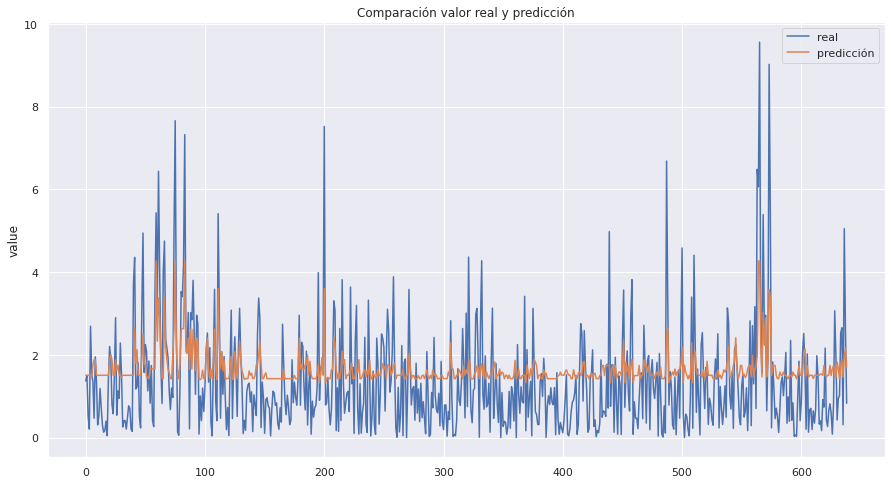

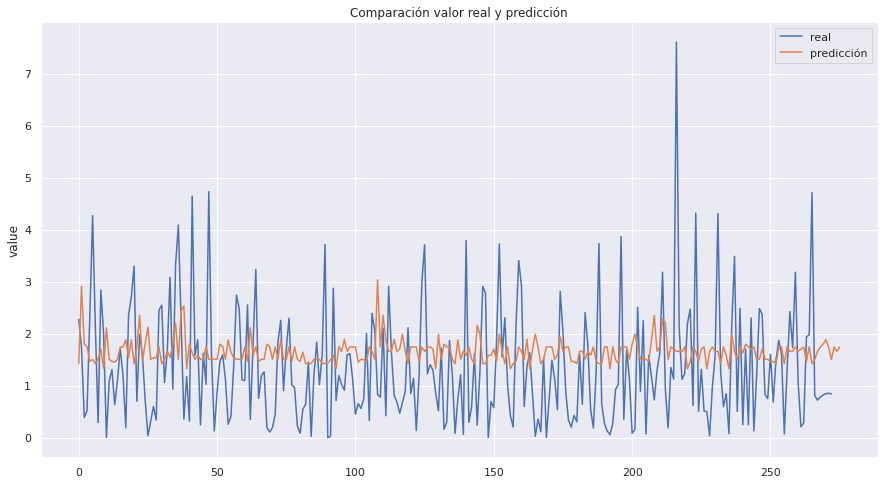

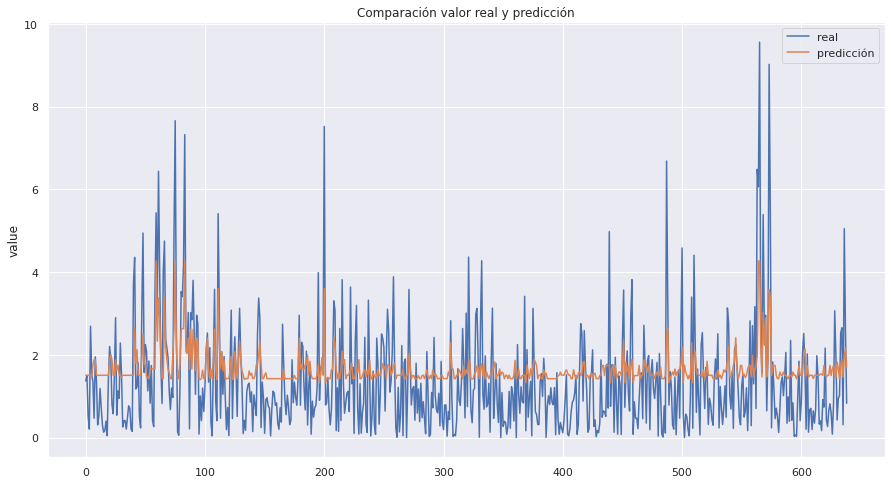

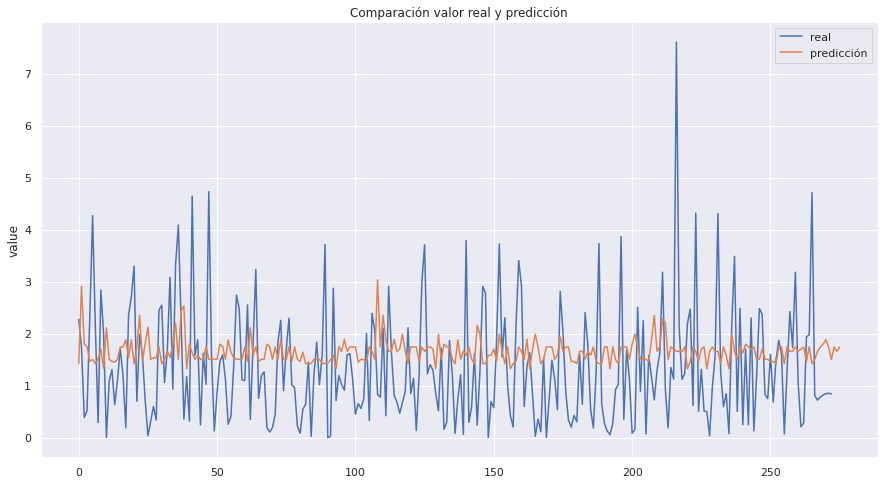

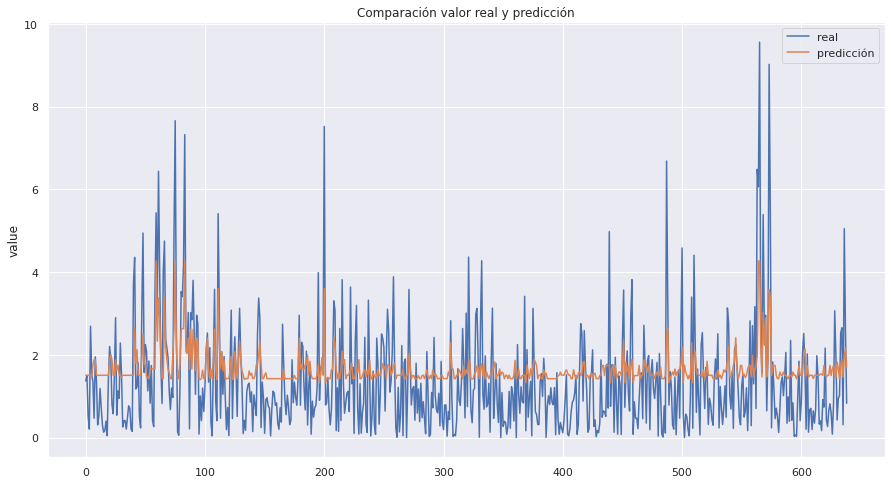

...

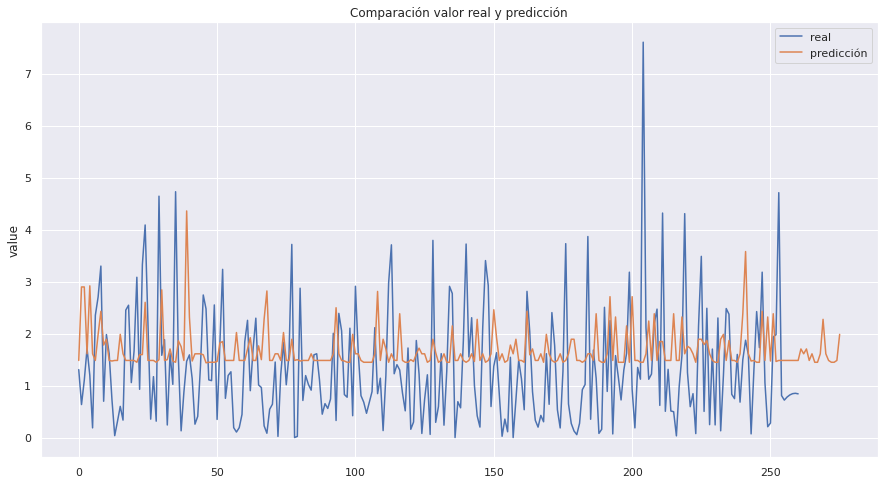

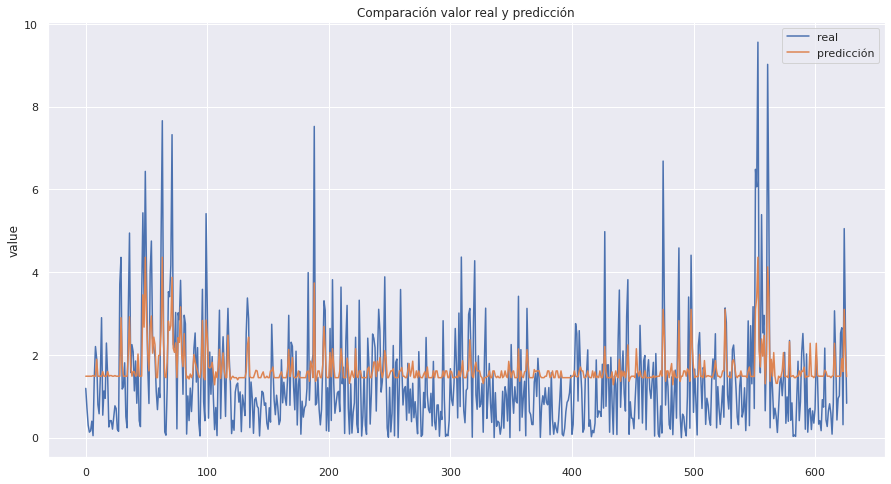

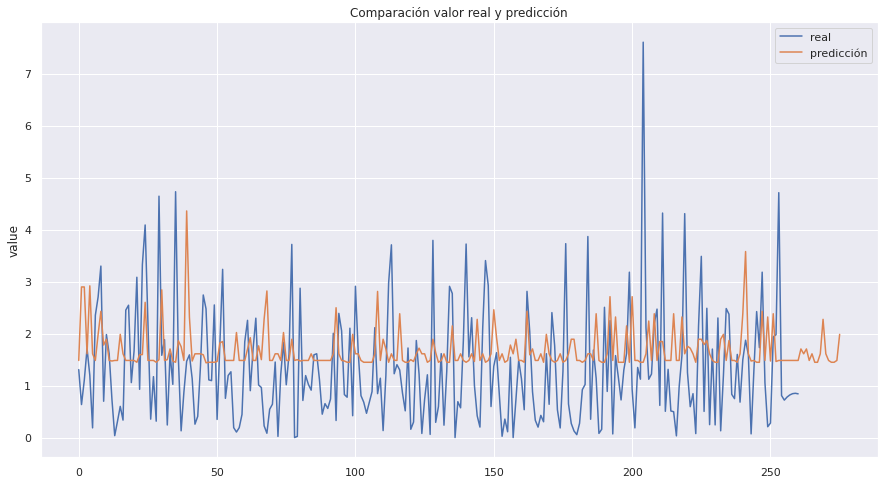

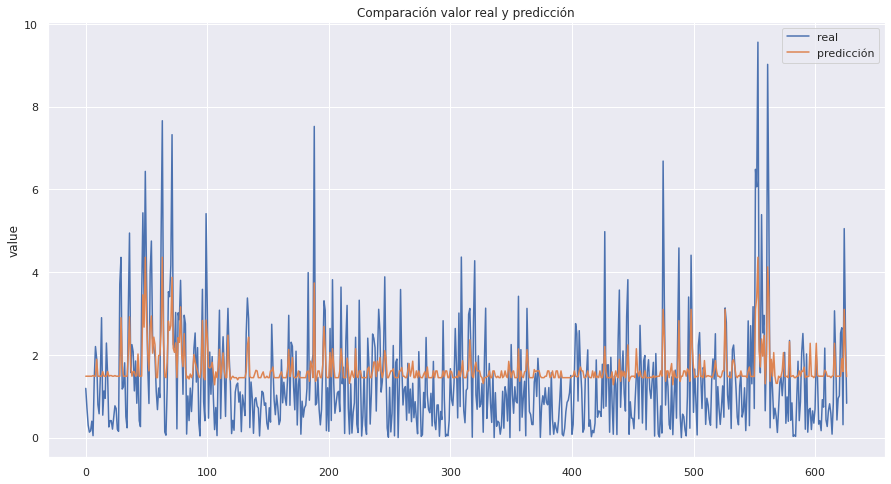

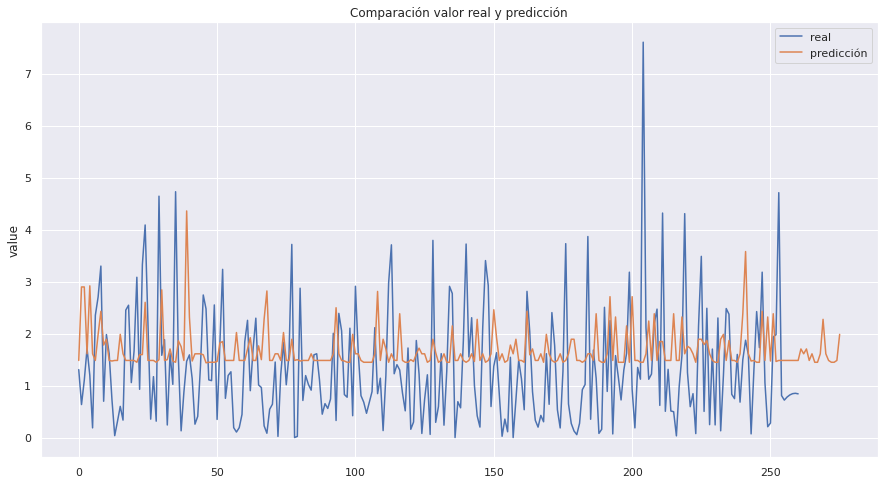

In [17]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(10,100,10)]
n_estimators.extend([200,300,500])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)